# Major League Baseball Game Logs, EDA Part 1

*The information used here was obtained free of charge from and is copyrighted by Retrosheet.  Interested parties may contact Retrosheet at "www.retrosheet.org".*



## 1. Introduction

Baseball is unique among the four major North American professional sports because of the discrete nature of events that occur during a contest. Famously, baseball does not have a game clock in the same manner as American football, basketball, and ice hockey. Games are completed after a specified number of events (plays) have occurred. Each event begins and ends when directed by the umpires and there are a small number of outcomes for each play. Consequently, recording these play-by-play events is a trivial task and the historical record has more than one hundred years of data available for analysis.

Game logs are convenient summaries of the play-by-play events of a game at the team level. They record the total number of selected events which occurred and relate them to the outcome of a game. Modern data-collection techniques and statistics have moved far beyond game logs and per-game means for evaluating teams or players. Game logs are, however, are a valuable source of data for a low-level analysis. This series will use MLB historical game logs to answer some fundamental questions about the nature of baseball: how has the offensive environment in baseball changed over time? How are the various statistics distributed? What contributes to a run scored or a win?

## 2. Motivation

As the first part of a series, this project will be an exploratory data analysis (EDA) with a limited scope. The primary goal is to examine how run scoring has evolved over time and identify a stable period of run scoring with which to perform further analyses. Specifically, we will look at what factors merit consideration in a predictive model for the number of runs scored or wins, for example.

The CSV file containing the game-log data has the following columns:

**Offensive Categories**
- *season*: Season in which game is played (year).
- *league*: League of the home team.
- *win*: Indicator of win or loss.
- *score*: Number of runs scored by a team's offense.
- *ab*: Number of at-bats for a team's offense. An official at-bat comes when a batter reaches base via a fielder's choice, hit or an error (not including catcher's interference) or when a batter is put out on a non-sacrifice.
- *1b*: Number singles for a team's offense.
- *2b*: Number of doubles for a team's offense.
- *3b*: Number of triples for a team's offense.
- *4b*: Number of home runs for a team's offense.
- *sach*: Number of sacrifice hits (or sacrifice bunts) for a team's offense. A sacrifice bunt occurs when a player is successful in his attempt to advance a runner (or multiple runners) at least one base with a bunt.
- *sacf*: Number of sacrifice flies for a team's offense. A sacrifice fly occurs when a batter hits a fly-ball out to the outfield or foul territory that allows a runner to score. The batter is given credit for an RBI.
- *hbp*: Number of hit-by-pitches for a team's offense. A hit-by-pitch occurs when a batter is struck by a pitched ball without swinging at it. He is awarded first base as a result. Strikes supersede hit-by-pitches, meaning if the umpire rules that the pitch was in the strike zone or that the batter swung, the HBP is nullified.
- *bb*: Number of base-on-balls (walks) for a team's offense. A walk (or base on balls) occurs when a pitcher throws four pitches out of the strike zone, none of which are swung at by the hitter. After refraining from swinging at four pitches out of the zone, the batter is awarded first base. In the scorebook, a walk is denoted by the letters BB.
- *ibb*: Number of intentional base-on-balls (walks) for a team's offense. An intentional walk occurs when the defending team chooses to walk a batter on purpose, putting him on first base instead of letting him try to hit.
- *k*: Number of strikeouts for a team's offense.
- *sb*: Number of stolen bases for a team.
- *cs*: Number of caught stealing for a team.
- *gidp*: Number of grounded-into-double-plays for a team's offense. A GIDP occurs when a player hits a ground ball that results in multiple outs on the bases.
- *ci*: Number of catcher's interference awarded to a teams' offense. The batter is awarded first base if the catcher (or any other fielder) interferes with him at any point during a pitch. If first base was occupied at the time of the pitch, the runner who held the base is allowed to move up one base.
- *lob*: The total number (over the course of a game) of runners left on base at the end of each inning by a team's offense.

**Defensive Categories**

- *numPitchers*: Number of pitchers appearing in the for a team's defense.
- *er*: Number of earned runs surrendered by a team's defense. An earned run is any run that scores against a pitcher without the benefit of an error or a passed ball.
- *teamER*: Number of earned runs surrendered by a team's defense that is not assigned to a specific pitcher.
- *wp*: Number of wild pitches surrendered by a team's defense. A pitcher is charged with a wild pitch when his pitch is so errant that the catcher is unable to control it and, as a result, baserunner(s) advance.
- *balk*: Number of balks surrendered by a team's defense. A balk occurs when a pitcher makes an illegal motion on the mound that the umpire considers to be deceitful to the runner(s).
- *po*: Number of putouts recorded by a team's defense. A fielder is credited with a putout when he is the fielder who physically records the act of completing an out -- whether it be by stepping on the base for a force out, tagging a runner, catching a batted ball, or catching a third strike.
- *assist* Number of assists recorded by a team's defense. An assist is awarded to a fielder who touches the ball before a putout is recorded by another fielder. Typically, assists are awarded to fielders when they throw the ball to another player -- but a fielder receives an assist if he touches the ball, even if the contact was unintentional.
- *err*: Number of errors recorded by a team's defense. A fielder is given an error if, in the judgment of the official scorer, he does not convert an out on a play that an average fielder should have made. Fielders can also be given errors if they make a poor play that allows one or more runners to advance on the bases.
- *pb*: Number of passed balls recorded by a team's defense. A catcher is charged with a passed ball when he does not hold or control a legally pitched ball that, with ordinary effort, should have been maintained under his control, and, as a result of this loss of control, the batter or a runner on base advances. A runner who advances due to a passed ball is not credited with a stolen base unless he breaks for the base before the pitcher begins his delivery.
- *dp*: Number of double plays recorded by a team's defense. A double play occurs when two offensive players are ruled out within the same play.
- *tp*: Number of triple plays recorded by a team's defense. A triple play occurs when three offensive players are ruled out within the same play.


## 3. Analysis

### 3.1 Import Modules and Packages

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm
from statsmodels.distributions.empirical_distribution import ECDF
import scipy.stats as ss
import numpy as np

from IPython.display import HTML, IFrame

### 3.2 Define Functions

In [2]:
def getRuleChanges():
    rcD = {}

    rcD[1872] = """1872
Ball size and weight are regulated and remain the same to this date."""

    rcD[1877] = """1877
Canvas bases 15 inches square were introduced.
Home plate was placed in the angle formed by the intersection of the first and 
    third base lines.
Player reserve clause was written into the contracts for the first time.
The base runner was out if hit by a batted ball.
The hitter was exempted from a time at bat if he walked."""

    rcD[1878]="""1878
The number of "called balls" became 9 and all balls were either strikes, balls 
    or fouls."""

    rcD[1879] = """1879
Player reserve clause was for the first time put into a contract.
The pitcher had to face a batsman before pitching to him.
A staff of umpires was first introduced."""

    rcD[1880] = """1880
Base on balls was reduced to 7 "called balls."
Batter no longer got a fourth strike.
Front of pitcher's box moved to 50 feet from the center of home plate.
The catcher had to catch the pitch on the fly in order to register an out on a 
    third strike."""

    rcD[1882] = """1882
Pitchers now allowed to throw sidearm.
The "foul bound catch" was abolished and the pitcher could deliver a ball from 
    above his waist"""

    rcD[1883] = """1883
Championships were to be decided on a percentage basis.
Six "called balls" became a base on balls."""

    rcD[1884] = """1884
All restrictions on the delivery of a pitcher were removed."""

    rcD[1885] = """1885
A granulated substance may be applied up to 18" from the bottom of the bat.
Chest protectors worn by catchers and umpires came into use.
Home base could be made of marble or whitened rubber.
One portion of the bat could be flat (one side).
The pitcher's box was changed to 4 feet by 7 feet."""

    rcD[1886] = """1886
Stolen bases became an official statistic."""

    rcD[1887] = """1887
The pitcher's box was reduced to 4 feet by 5 1/2 feet.
Calling for high and low pitches was abolished.
Choice of innings given to home team captain.
Five balls became a base on balls.
Four "called strikes" were adopted for this season only.
Bases on balls were recorded as hits for this season only.
The batter was awarded first base when hit by a pitch.
Pitcher must keep his back foot on the rear line of the pitcher's box (55.5 feet 
    from middle of home plate).
Strike zone established between shoulders and knees."""

    rcD[1888] = """1888
A batsman was credited with a base hit when a runner was hit by his batted ball.
Batter awarded a hit when a runner is out for being hit by batted ball.
The base on balls exemption from a time at bat was restored."""

    rcD[1889] = """1889
A sacrifice hit was statistically recognized.
Four balls became a base on balls.
One predesignated substitute may be used at the end of any complete inning."""

    rcD[1890] = """1890
Two substitutes may be used and may enter at any time."""

    rcD[1891] = """1891
Substitutions were permitted at any point in the game.
Large padded mitts were allowed for catchers."""

    rcD[1893] = """1893
The pitching box was eliminated and a rubber slab 12 inches by 4 inches was substituted.
The pitcher was required to place his rear foot against the slab.
The slab was moved from 50 feet to 60 feet 6 inches from rear of home plate.
The rule allowing a flat side to a bat was rescinded.
The requirement that the bat be round and wholly of hard wood was substituted."""

    rcD[1894] = """1894
Foul bunts were classified as strikes.
Sacrifice hits limited to bunts and not counted as at bats.
The rule exempting a batter from a time at bat on a sacrifice was instituted."""

    rcD[1895] = """1895
A held foul tip was classified as a strike.
Bats were permitted to be 2 3/4 inches in diameter and not to exceed 42 inches.
Infield-fly rule was adopted.
Pitching slab was enlarged to 24 inches by 6 inches.
Size of gloves limited except for catchers and first basemen."""

    rcD[1899] = """1899
Batter awarded first on catcher's interference."""

    rcD[1900] = """1900
Plate changed from square to five-sided figure."""

    rcD[1901] = """1901
All foul balls not caught on fly counted as strikes until batter has two strikes.
Catchers were compelled to remain continuously under the bat."""

    rcD[1903] = """1903
Height of the mound was limited to 15 inches higher than the level of the baselines.
Foul strike rule was adopted by the American League."""

    rcD[1908] = """1908
Pitchers were prohibited from soiling a new ball.
The sacrifice fly rule was adopted."""

    rcD[1909] = """1909
Relief pitcher must face at least one batter."""

    rcD[1910] = """1910
Stolen base no longer credited when other runner in a double steal is thrown out.
The cork center was added to the official baseball."""

    rcD[1917] = """1917
Earned-run statistics and definitions were added to the rules."""

    rcD[1920] = """1920
All freak deliveries, including the spitball, were outlawed.
Balk to be called if pitcher releases pitch while catcher is out of his box.
The failure of a preceding runner to touch a base would not affect the status 
    of a succeeding runner.
The batter was given credit for a home run in the last of the ninth inning if the 
    winning run was on base when the ball was hit out of the field.
The number of runs batted in were to be included in the official score.
Frivolous ninth-inning uncontested steals in one-sided games were were to be scored 
    as defensive indifference."""

    rcD[1925] = """1925
The minimum home-run distance was set at 250 feet."""

    rcD[1926] = """1926
Pitcher was allowed to use a rosin bag.
Sacrifice hit awarded when any runner advances on a fly out."""

    rcD[1931] = """1931
Balls that bounce over the fence entitle batter to two bases.
Balls hit over the fence are to be ruled fair or foul based on where they are 
    when they leave the field.
Sacrifice flies eliminated.
Regulations referring to a batter contacting his own ball were clarified as was 
    the area of bases awarded a batter when a defensive player threw his glove 
    at a batted or thrown ball or in the case of spectator interference."""

    rcD[1950] = """1950
Home team must bat second.
Mound must be 15 inches high.
Rules for determining winning and losing pitcher established.
Size of first baseman's glove/mitt regulated.
Strike zone redefined to from armpits to top of knees."""

    rcD[1953] = """1953
Players were to remove their gloves from the field (in 1954) 
    when batting and no equipment was to show on the field at any time."""

    rcD[1954] = """1954
Defensive interference was changed from an offense solely by a catcher to one by 
    a fielder as well.
No fielder could take a position in line with a batter's vision with the deliberate 
    intent to in any way distract the batter.
Sacrifice fly rule was brought back, this time with a man scoring after the catch only."""


    rcD[1959] = """1959
Regulations were set up for minimum boundaries for all new parks, 325-400-325 feet."""

    rcD[1963] = """1963
Strike zone enlarged to from top of the shoulders to the knees."""

    rcD[1965] = """1965
The size of the catcher's mitt was regulated."""

    rcD[1968] = """1968
The anti-spitball rule was rewritten and tightened up because of the wave
of moistened pitches that floated plateward the prior season."""

    rcD[1969] = """1969
The pitcher's mound was dropped five inches.
The strike zone was shrunken to the area from the armpits to the top of the 
    batter's knees.
The save rule was added to the official rules for the first time."""

    rcD[1971] = """1971
All major-league players were ordered to wear protective helmets."""

    rcD[1973] = """1973
The American League began using designated hitter for pitchers on an experimental basis.
The rule on glove size and color was minutely outlined for standardization."""

    rcD[1974] = """1974
The save rule was rewritten.
Minimum standards for individual championships were outlined."""

    rcD[1975] = """1975
The ball was permitted to be covered with cowhide because of the shortage of horses.
Suspension for three days became mandatory if batter were to hit a fair ball with 
    a filled, doctored or flat-surfaced bat.
Current save rule was adopted."""

    rcD[1978] = """1978
Pitcher can't throw at the batter."""

    rcD[1988] = """1988
Catchers must wear protective helmets while on defense."""

    rcD[1997] = """1997
Regular-season interleague play begins."""

    rcD[2006] = """2006
The Joint Drug Prevention and Treatment Program was adopted in the Spring of 2006."""

    rcD[2008] = """2008
MLB adds limited (home run calls, fair or foul) instant reply to be in effect for 
    all games starting on Friday, August 29th."""

    rcD[2016] = """2016
Slides on potential double plays will require that base runners \nmust make a 
    bona fide attempt to reach and remain on base."""

    rcD[2020] = """2020
Temporary / COVID-19 Pandemic Rules Added for Shortened Season:
    Extra-inning runner on second base automatically.
    Seven-inning doubleheaders.
    The postseason expands to 16 teams.
    Universal designated hitter."""

    return(rcD)

In [3]:
# Define color map for plots
cMap = ['#1f77b4',  '#ff7f0e','#2ca02c',  '#d62728',  '#9467bd',  '#8c564b',  '#e377c2',  '#7f7f7f',  
        '#bcbd22', '#17becf','#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', 
        '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', 
        '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000']

### 3.3 Load Data

In [5]:
# load data without index column
df = pd.read_csv('https://github.com/cmtoner/retrosheets-game-logs/raw/main/rs_GameLog_data01.zip', index_col=0)

df.head()

,season,league,win,score,ab,1b,2b,3b,4b,sach,...,er,teamER,wp,balk,po,assist,err,pb,dp,tp
0,1933,ML,1,4,31.0,8.0,0.0,0.0,1.0,1.0,...,2.0,2.0,0.0,0.0,27.0,11.0,1.0,0.0,1.0,0.0
1,1935,ML,1,4,32.0,4.0,2.0,1.0,1.0,0.0,...,1.0,1.0,0.0,0.0,27.0,10.0,0.0,0.0,0.0,0.0
2,1937,ML,1,8,35.0,8.0,3.0,1.0,1.0,0.0,...,3.0,3.0,0.0,0.0,27.0,15.0,2.0,0.0,0.0,0.0
3,1939,ML,1,3,31.0,5.0,0.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,27.0,9.0,1.0,0.0,1.0,0.0
4,1941,ML,1,7,36.0,7.0,3.0,0.0,1.0,0.0,...,5.0,5.0,0.0,0.0,27.0,11.0,3.0,0.0,1.0,0.0


### 3.4 Descriptive Statistics

The descriptive statistics are not particularly interesting, but are included for the sake of completeness. 

In [6]:
# select columns of interest and produce summary statistics
cols = ['score', 'ab', '1b', '2b', '3b', '4b','sach', 'sacf']
df[cols].describe().round(3)

,score,ab,1b,2b,3b,4b,sach,sacf
count,448958.000,409212.000,409074.000,409080.000,409120.000,409132.000,409212.000,378314.000
mean,4.539,34.052,6.299,1.544,0.278,0.757,0.534,0.202
std,3.276,4.579,2.837,1.329,0.563,0.977,0.834,0.470
min,0.000,11.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,2.000,31.000,4.000,1.000,0.000,0.000,0.000,0.000
50%,4.000,33.000,6.000,1.000,0.000,0.000,0.000,0.000
75%,6.000,36.000,8.000,2.000,0.000,1.000,1.000,0.000
max,49.000,95.000,35.000,13.000,8.000,10.000,9.000,5.000


In [7]:
cols = ['hbp', 'bb', 'ibb', 'k', 'sb', 'cs', 'gidp', 'ci','lob', 'numPitchers']
df[cols].describe().round(3)

,hbp,bb,ibb,k,sb,cs,gidp,ci,lob,numPitchers
count,409145.000,408820.000,356657.000,404142.000,409090.000,366774.000,361866.000,401874.000,409208.000,409212.000
mean,0.253,3.217,0.265,5.319,0.632,0.305,0.753,0.004,7.039,2.743
std,0.524,2.138,0.570,3.001,0.979,0.566,0.853,0.064,2.662,1.494
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000
25%,0.000,2.000,0.000,3.000,0.000,0.000,0.000,0.000,5.000,1.000
50%,0.000,3.000,0.000,5.000,0.000,0.000,1.000,0.000,7.000,3.000
75%,0.000,4.000,0.000,7.000,1.000,1.000,1.000,0.000,9.000,4.000
max,6.000,19.000,8.000,26.000,15.000,6.000,7.000,2.000,27.000,13.000


In [8]:
cols = ['er', 'teamER', 'wp', 'balk', 'po', 'assist','err', 'pb', 'dp', 'tp']
df[cols].describe().round(3)


,er,teamER,wp,balk,po,assist,err,pb,dp,tp
count,389418.000,407998.000,408784.000,409212.000,409194.000,409192.000,409149.000,409112.000,409160.000,409212.000
mean,3.916,3.472,0.267,0.035,26.782,10.922,0.962,0.086,0.910,0.001
std,2.916,3.032,0.550,0.194,2.902,3.598,1.175,0.314,0.928,0.037
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,2.000,1.000,0.000,0.000,26.000,8.000,0.000,0.000,0.000,0.000
50%,3.000,3.000,0.000,0.000,27.000,11.000,1.000,0.000,1.000,0.000
75%,6.000,5.000,0.000,0.000,27.000,13.000,1.000,0.000,1.000,0.000
max,31.000,31.000,8.000,6.000,75.000,42.000,30.000,11.000,7.000,2.000


In [9]:
del(cols)

### 3.5 Offensive Production By Season

Examine offensive production by season. Included are the dates of significant rule changes, with the usual caveat that correlation does not imply causation. Rule changes, park dimensions, player skill sets, and evolving strategies all contribute to how runs are scored. Observing a correlation between the introduction of a rule and a change in the mean number of runs scored per game may warrant further analysis, but it does not imply a causal relationship.

A visual inspection of the following plots, however, does seem to show that offensive production begins to stabilize in the early 1900's. By 1920, most of the rules we would recognize in the modern game are established, apart from the introduction of the designated hitter (1973). Year-to-year variance in the offensive statistics after this point are far less than in the earlier 'era' and give way to long-term trends that could be attributed to the factors mentioned above. Popularly, 1920 is generally considered the end of the 'dead ball' era in baseball which coincides with the emergence of power hitters, most notably Babe Ruth.


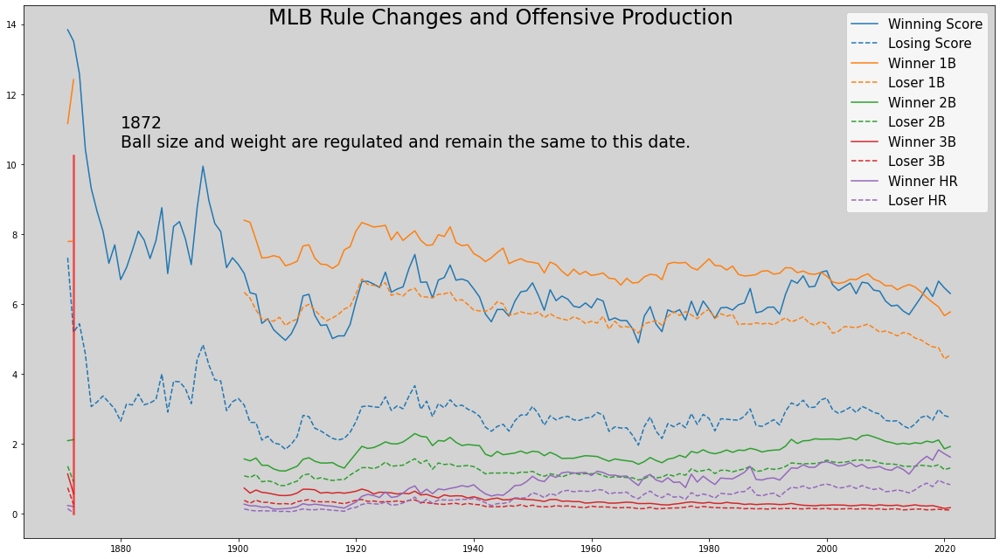

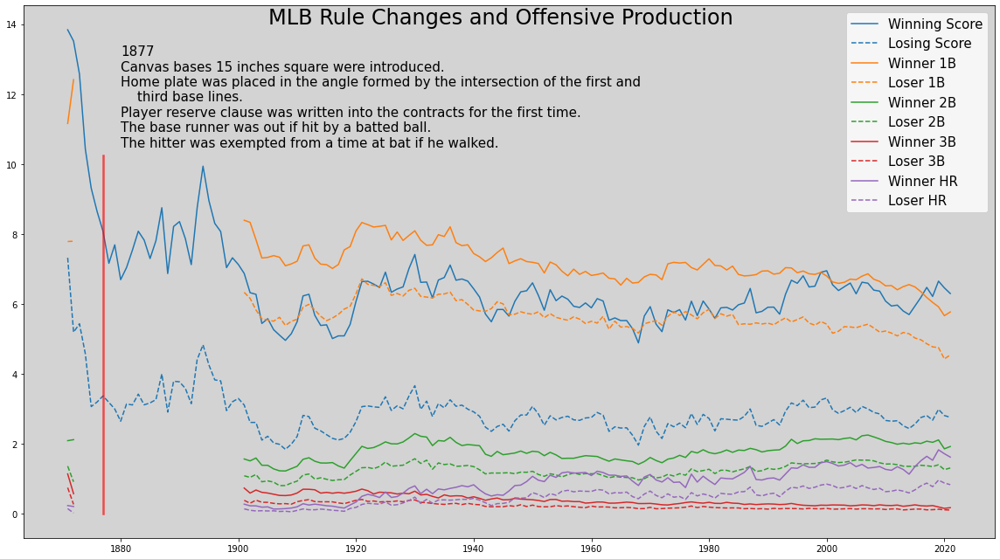

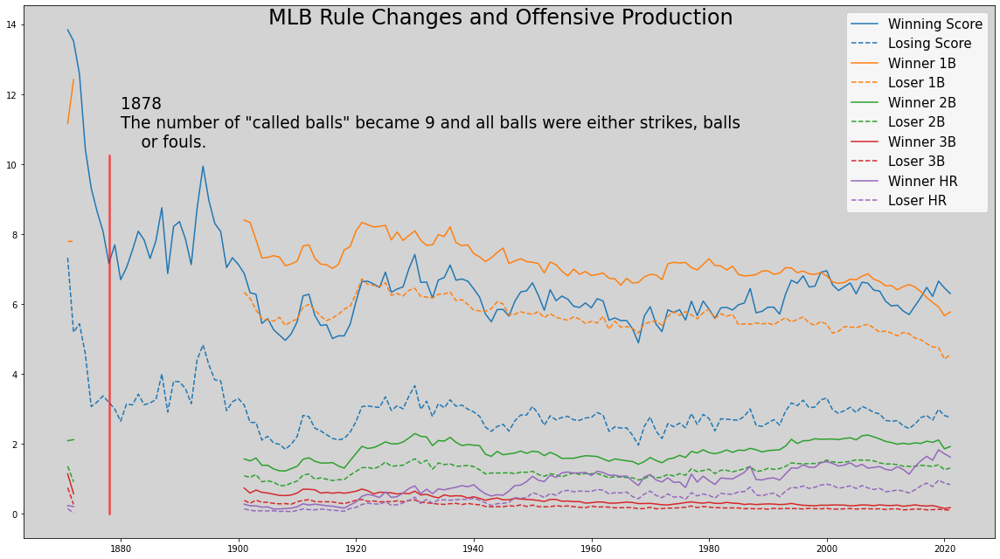

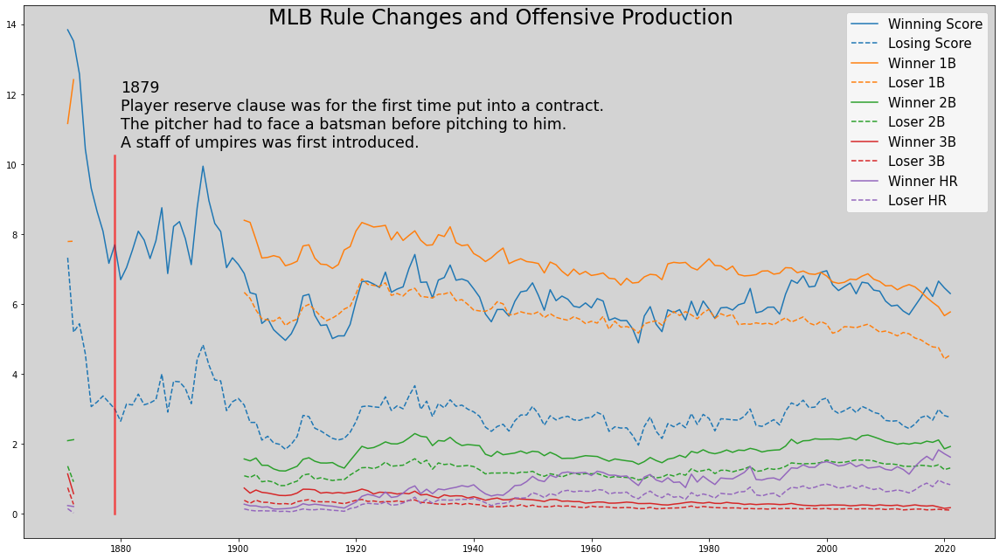

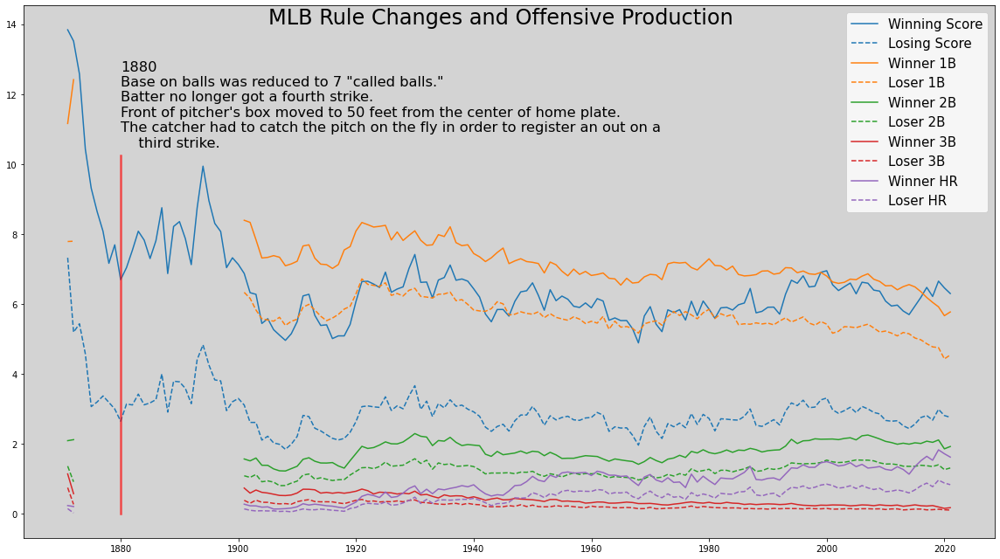

...

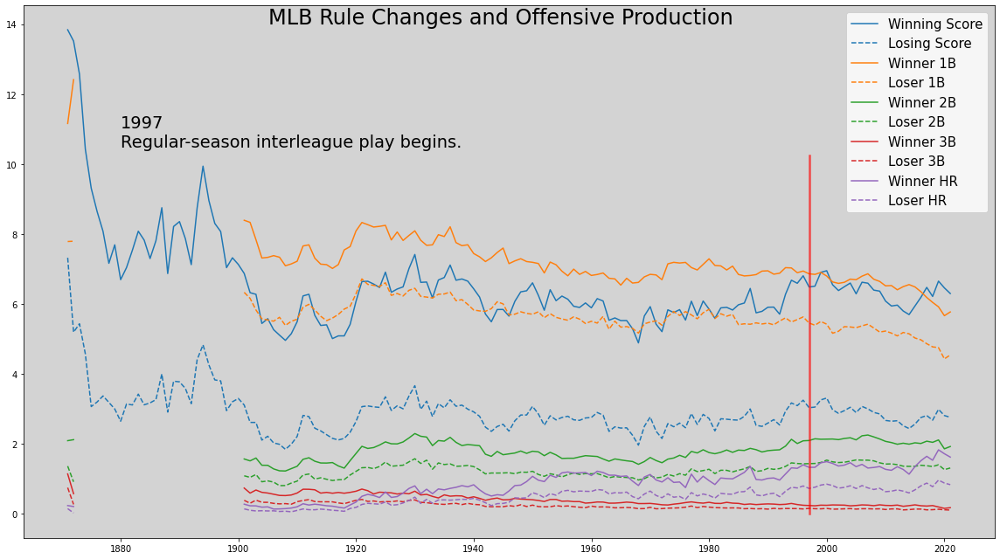

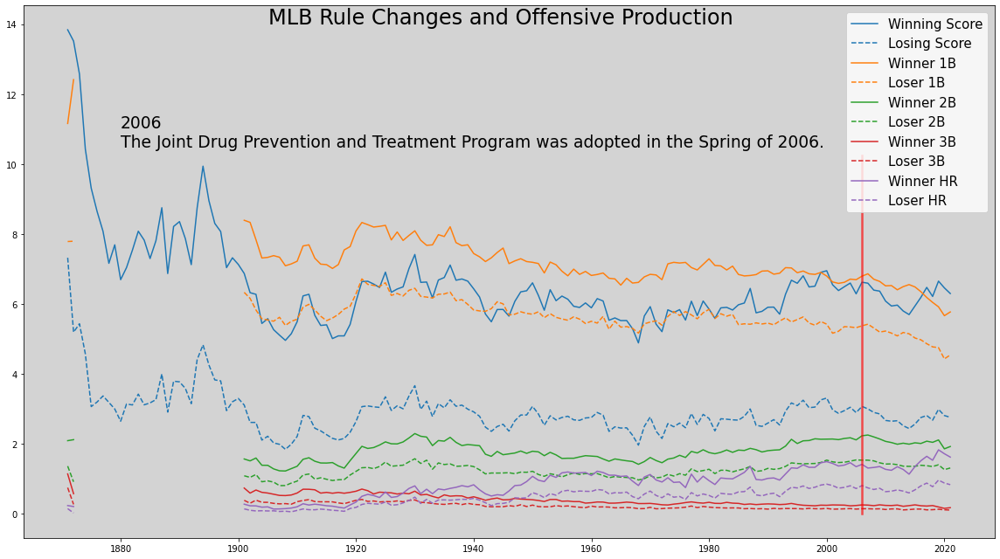

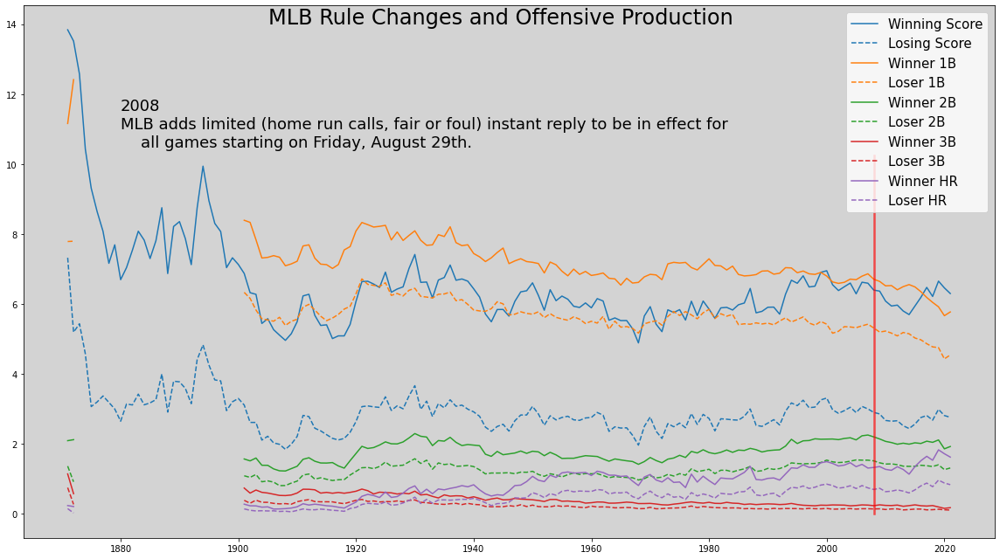

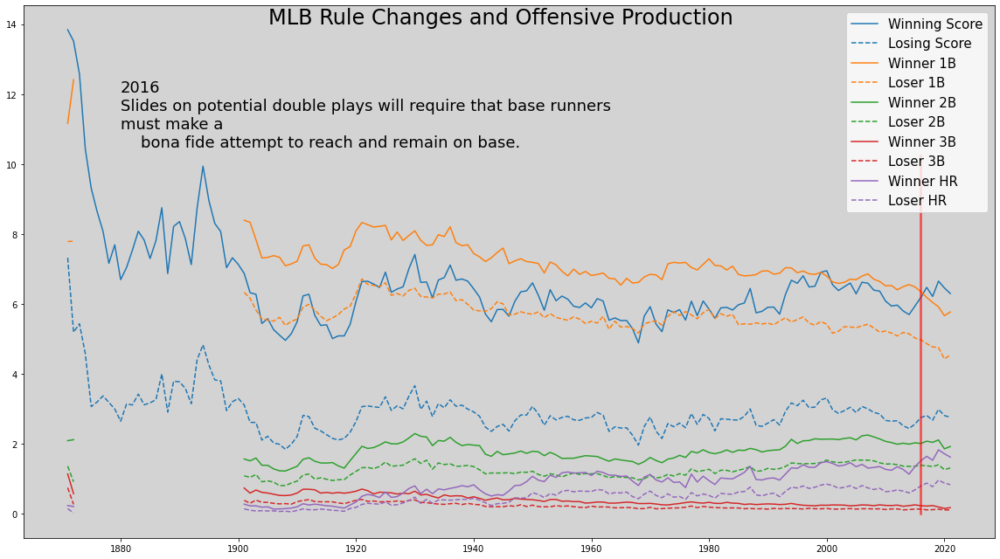

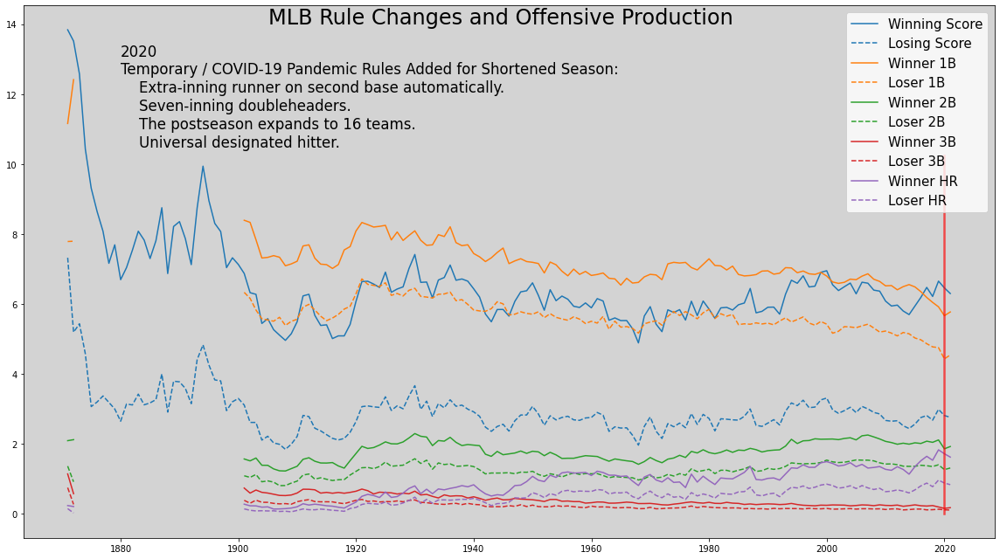

In [10]:
# group means by year and winner/loser
g0 = df.groupby(['season','win'],dropna=True).mean()

# get winner.loser indices
ixW = [i for i in g0.index if i[1]==1]
ixL = [i for i in g0.index if i[1]==0]

# define columns of interest
cOI = ['score','1b','2b','3b','4b','bb','k','sb','cs','numPitchers','err','dp']

# get rule changes dictionary
ruleChanges = getRuleChanges()

# suppress runtime warning
plt.rcParams.update({'figure.max_open_warning': 0})

# plot basic off stats and rule changes
for k in ruleChanges.keys():
    fig = plt.figure(figsize=(16,9), tight_layout=True)
    fig.suptitle('MLB Rule Changes and Offensive Production',fontsize=24)
    
    #plot first 5 stats
    for i in range(5):
        x = [j for j in range(1871,2022,1)]
        yW = g0.loc[ixW,cOI[i]]
        yL = g0.loc[ixL,cOI[i]]
        plt.plot(x, yW,
                 color=cMap[i], 
                 linestyle='solid')
        plt.plot(x, yL,
                 color=cMap[i], 
                 linestyle='dashed')

    # plot rule changes
    plt.plot([k,k],[0,10.25],
             color='red',
             alpha=0.65, 
             linewidth=2.5)
    plt.text(1880,10.5,
             ruleChanges[k],
             fontsize=20-8.5*(len(ruleChanges[k])/578))
    plt.legend(['Winning Score','Losing Score','Winner 1B','Loser 1B','Winner 2B',
                'Loser 2B','Winner 3B','Loser 3B','Winner HR','Loser HR'],
               fontsize=15,
               loc='upper right')
    plt.gca().set_facecolor('lightgray')


In [11]:
# clear fig
del(fig)

# reset runtime warning
plt.rcParams.update({'figure.max_open_warning': 1})

Like the previous plots, the following video examines offensive production by league from 1871-2021. Again, correlation does not imply causation and a visual inspection of these basic statistics is not a quantitative analysis.
 
The American League, however, is clearly more productive offensively. Furthermore, the AL maintains that advantage continuously from 1973 (introduction of the DH) to the present.

In [12]:
# Youtube
display(IFrame(width="1280",
               height="720",
               src="https://www.youtube.com/embed/THp4zeYiEIg",
               title="YouTube video player",
               frameborder="0",
               allow="accelerometer; clipboard-write; encrypted-media; gyroscope"))

Per-game means by year and by winner/loser, with LOESS curves. This plot illustrates the long-term trends previously discussed. Additionally, we can see hints at what factors contribute run scoring by looking at the differences in the per-game means between the winning and losing teams. 

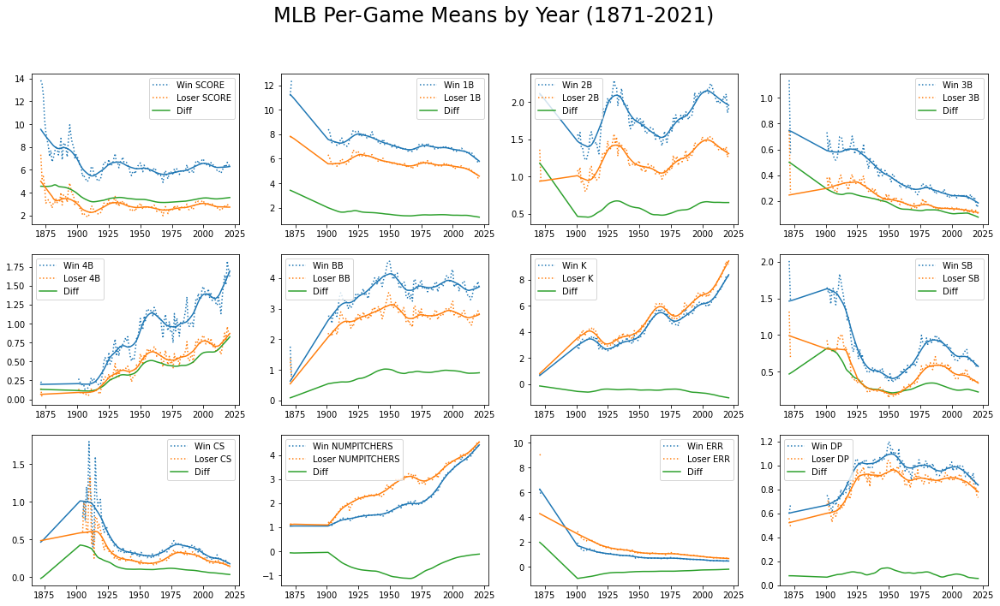

In [13]:

# set loess parameters
I = 3
F = 0.15

# get winner.loser indices
ixW = [i for i in g0.index if i[1]==1]
ixL = [i for i in g0.index if i[1]==0]

# define xaxis
x = [j for j in range(1871,2022,1)]

fig = plt.figure(figsize=(20,11), tight_layout=False)
fig.suptitle('MLB Per-Game Means by Year (1871-2021)',fontsize=24)

for i in range(len(cOI)):
    yW = g0.loc[ixW,cOI[i]]
    yL = g0.loc[ixL,cOI[i]]
    loessW = sm.nonparametric.lowess(yW, x, frac=F, it=I)
    loessL = sm.nonparametric.lowess(yL, x, frac=F, it=I)
    
    ax = fig.add_subplot(3,4,i+1)

    ax.plot(x, yW,
             color=cMap[0],
             linestyle='dotted')
    ax.plot(x, yL,
             color=cMap[1],
             linestyle='dotted')
    ax.plot(loessL[:,0],loessW[:,1]-loessL[:,1],
             color=cMap[2],
             linestyle='solid')
    ax.plot(loessW[:,0],loessW[:,1],
             color=cMap[0],
             linestyle='solid')
    ax.plot(loessL[:,0],loessL[:,1],
             color=cMap[1],
             linestyle='solid')
    ax.legend([f'Win {cOI[i].upper()}',f'Loser {cOI[i].upper()}','Diff'],
               loc='best')

# clean house
del(F, I, i, ixL, ixW, loessL, loessW, x, yL, yW)
del(ax)
del(fig)

Offensive statistics by season and by league. Note that the American League has enjoyed extended periods of superior offensive production, even before the introduction of the DH in 1973.

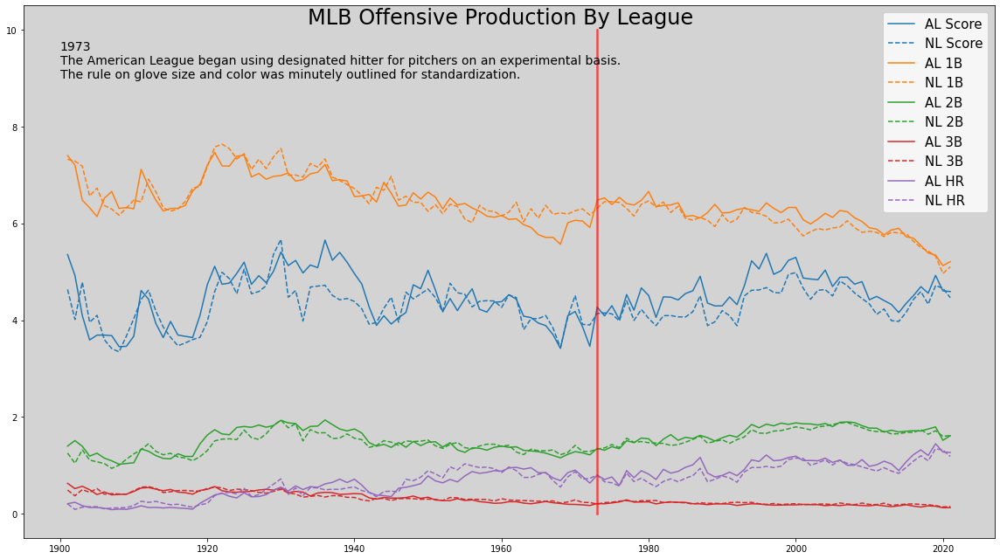

In [14]:
m0 = df.season>=1901
m1 = (df.league=='NL')|(df.league=='AL')

g2 = df[m0&m1].groupby(['season','league'], dropna=True).mean()

ixAL = [i for i in g2.index if i[1]=='AL']
ixNL = [i for i in g2.index if i[1]=='NL']

# main stats
cOISubset0 = ['score', '1b', '2b', '3b', '4b']

fig = plt.figure(figsize=(16,9), tight_layout=True)
fig.suptitle('MLB Offensive Production By League',fontsize=24)
for i in range(len(cOISubset0)):
    x = [j for j in range(1901,2022,1)]
    yAL = g2.loc[ixAL,cOISubset0[i]]
    yNL = g2.loc[ixNL,cOISubset0[i]]
    plt.plot(x, yAL,
             color=cMap[i], 
             linestyle='solid')
    plt.plot(x, yNL,
             color=cMap[i], 
             linestyle='dashed')

k = 1973
plt.plot([k,k],[0,10],color='red',alpha=0.65, linewidth=2.5)
plt.text(1900,9,ruleChanges[k],fontsize=14)
plt.legend(['AL Score','NL Score','AL 1B','NL 1B','AL 2B',
            'NL 2B','AL 3B','NL 3B','AL HR','NL HR'],
           fontsize=15,
           loc='upper right')
plt.gca().set_facecolor('lightgray')

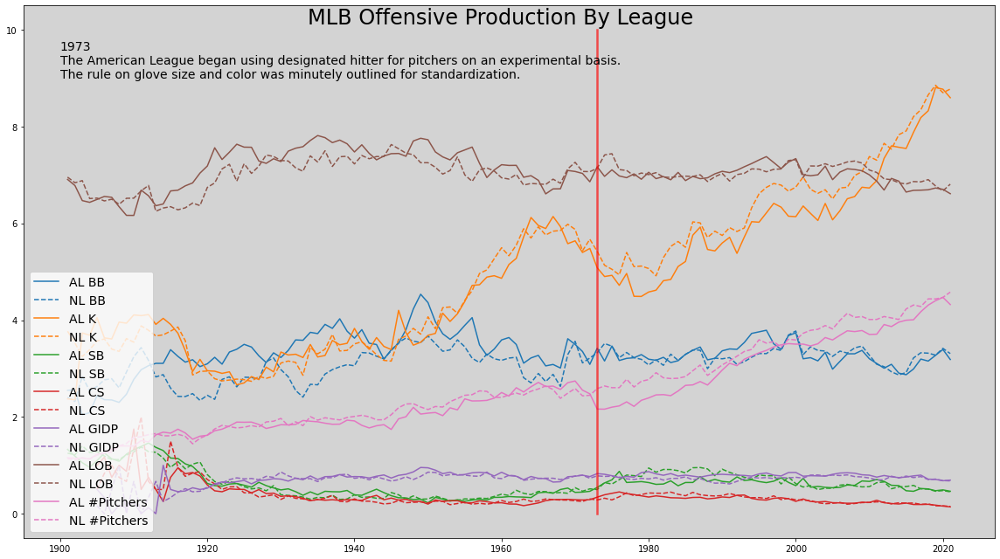

In [15]:
# other stats
cOISubset1 = [ 'bb','k', 'sb', 'cs','gidp', 'lob', 'numPitchers']

fig = plt.figure(figsize=(16,9), tight_layout=True)
fig.suptitle('MLB Offensive Production By League',fontsize=24)
for i in range(len(cOISubset1)):
    x = [j for j in range(1901,2022,1)]
    yAL = g2.loc[ixAL,cOISubset1[i]]
    yNL = g2.loc[ixNL,cOISubset1[i]]
    plt.plot(x, yAL,
             color=cMap[i], 
             linestyle='solid')
    plt.plot(x, yNL,
             color=cMap[i], 
             linestyle='dashed')

k = 1973
plt.plot([k,k],[0,10],color='red',alpha=0.65, linewidth=2.5)
plt.text(1900,9,ruleChanges[k],fontsize=14)
plt.gca().set_facecolor('lightgray')

plt.legend(['AL BB','NL BB','AL K','NL K','AL SB','NL SB','AL CS','NL CS','AL GIDP','NL GIDP',
            'AL LOB','NL LOB','AL #Pitchers','NL #Pitchers'],
           fontsize=14,
           loc='lower left')

del(cOISubset0, cOISubset1, fig, i, ixAL, ixNL, k, m0, m1, x, yAL, yNL)

Examine only the differences between the American League and National League statistics with LOESS curves. We will set aside any speculation on the causes for now. Any predictive model for runs scored, however, should include league membership as a feature. Most of the statistics associated with increased offense output favor the American League, often prior to the introduction of the DH in 1973.

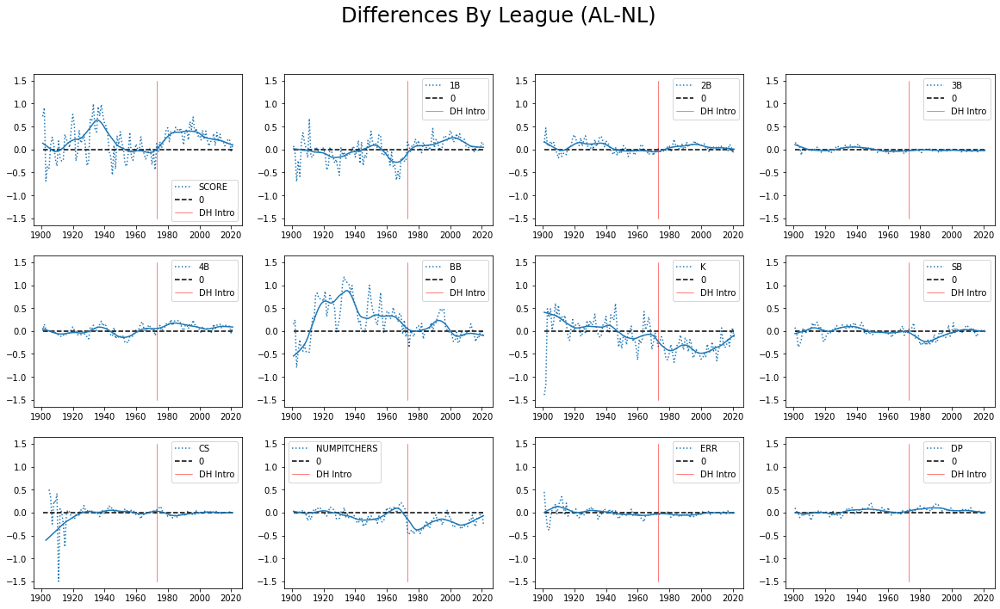

In [16]:
g2Diff = g2.diff(periods=1,axis=0)

season = []
dropIX = []
#get rid of AL rows
for i in g2Diff.index:
    if "AL" in i:
        dropIX.append(i)
        season.append(i[0])
        
g2Diff.drop(dropIX,axis=0,inplace=True)
    
g2Diff = g2Diff*-1

# set indices to season
g2Diff.index = [i for i in range(1901,2022,1)]

# plot the diffs
F = 0.15
I = 3

fig = plt.figure(figsize=(20,11), tight_layout=False)
fig.suptitle('Differences By League (AL-NL)',fontsize=24)

for i in range(len(cOI)):
    ax = fig.add_subplot(3,4,i+1)
    y = g2Diff[cOI[i]]
    xyL = sm.nonparametric.lowess(y, season, frac=F, it=I)
    
    ax.plot(season, y, linestyle='dotted',color=cMap[0])
    
    #plot zero line
    ax.plot([1901,2021], [0,0], linestyle='dashed',color='k')
    #plot DH line
    ax.plot([1973,1973],[-1.5,1.5], color='red', linewidth=0.5)
    #plot loess
    ax.plot(xyL[:,0], xyL[:,1], color=cMap[0], linestyle='solid')
    ax.legend([cOI[i].upper(),'0','DH Intro'], loc='best')

del(ax, dropIX, F, fig, i, I, xyL, y)
del(season)

## 4. Conclusions

The primary goal of this analysis was to identify a period of time with a stable run scoring environment. In popular media, the end of the "dead ball" era (1920) and the introduction of the DH (1973) are often cited as important demarcations in the history of MLB and the visual evidence supports these claims. Post 1920, longer term trends in game-log statistics appear to outweigh the year-to-year variance. Likewise, the introduction of the DH in 1973 is the point where American League teams outpace National League teams in nearly every category related to run scoring.  

The secondary goal was to identify features as potential candidates for inclusion in a predictive model for run scoring or wins. The hitting statistics (singles, doubles, home runs, and walks) should be included in such a model, for obvious reasons. Triples, intentional walks, and other rare events may be combined into a single feature or candidates for elimination during the model training process.